#  E-commerce_Python EDA: Campaign

## Step-1: Importing Python Libraries

In [249]:
# importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.impute import SimpleImputer

# warnings
import warnings
warnings.filterwarnings('ignore')

#Hypothesis Testing
from scipy.stats import shapiro, ttest_ind, mannwhitneyu, f_oneway, chi2_contingency, levene, kruskal

## Step-2: Reading the Dataset
1. Loading the data
2. Analyzing the data
3. Checking for duplicates
4. Missing Value Calculation

In [250]:
df = pd.read_csv('/content/campaign - campaign - campaign - campaign.csv')

In [251]:
df.shape

(2239, 27)

In [252]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Country
0,1826,1970,Graduation,Divorced,"$84,835.00",0,0,6/16/14,0,189,...,4,6,1,0,0,0,0,0,0,SP
1,1,1961,Graduation,Single,"$57,091.00",0,0,6/15/14,0,464,...,3,7,5,0,0,0,0,1,0,CA
2,10476,1958,Graduation,Married,"$67,267.00",0,1,5/13/14,0,134,...,2,5,2,0,0,0,0,0,0,US
3,1386,1967,Graduation,Together,"$32,474.00",1,1,5/11/14,0,10,...,0,2,7,0,0,0,0,0,0,AUS
4,5371,1989,Graduation,Single,"$21,474.00",1,0,4/8/14,0,6,...,1,2,7,1,0,0,0,0,0,SP


In [253]:
df.tail()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Country
2234,10142,1976,PhD,Divorced,"$66,476.00",0,1,3/7/13,99,372,...,2,11,4,0,0,0,0,0,0,US
2235,5263,1977,2n Cycle,Married,"$31,056.00",1,0,1/22/13,99,5,...,0,3,8,0,0,0,0,0,0,SP
2236,22,1976,Graduation,Divorced,"$46,310.00",1,0,12/3/12,99,185,...,1,5,8,0,0,0,0,0,0,SP
2237,528,1978,Graduation,Married,"$65,819.00",0,0,11/29/12,99,267,...,4,10,3,0,0,0,0,0,0,IND
2238,4070,1969,PhD,Married,"$94,871.00",0,2,9/1/12,99,169,...,5,4,7,0,1,1,0,0,0,CA


In [254]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2239 entries, 0 to 2238
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   ID                   2239 non-null   int64 
 1   Year_Birth           2239 non-null   int64 
 2   Education            2239 non-null   object
 3   Marital_Status       2239 non-null   object
 4   Income               2239 non-null   object
 5   Kidhome              2239 non-null   int64 
 6   Teenhome             2239 non-null   int64 
 7   Dt_Customer          2239 non-null   object
 8   Recency              2239 non-null   int64 
 9   MntWines             2239 non-null   int64 
 10  MntFruits            2239 non-null   int64 
 11  MntMeatProducts      2239 non-null   int64 
 12  MntFishProducts      2239 non-null   int64 
 13  MntSweetProducts     2239 non-null   int64 
 14  MntGoldProds         2239 non-null   int64 
 15  NumDealsPurchases    2239 non-null   int64 
 16  NumWeb

In [255]:
df.nunique()

,0
ID,2239
Year_Birth,59
Education,5
Marital_Status,8
Income,1974
Kidhome,3
Teenhome,3
Dt_Customer,663
Recency,100
MntWines,776


In [256]:
df.duplicated().sum()

0

In [257]:
df.isna().sum()

,0
ID,0
Year_Birth,0
Education,0
Marital_Status,0
Income,0
Kidhome,0
Teenhome,0
Dt_Customer,0
Recency,0
MntWines,0


**Observations:**
* Shape: Data has 2239 rows and 27 columns.
* Duplicates: No Duplicates found
* Missing values: No Missing values

## Step-3: Data Reduction

In [258]:
# Dropping the primary key column 'ID' since it's not useful for analysis
df = df.drop(['ID'], axis=1)

**Observations:**
* Removed the ID column since it's not necessary for analysis.

## Step-4: Feature Engineering

In [259]:
# Remove '$' and ',' from 'Income' and convert to numeric
df['Income'] = pd.to_numeric(df['Income'].str.replace('[\$,]', '', regex=True), errors='coerce')

In [260]:
# Convert 'Dt_Customer' to datetime format and create a 'Customer_Year' feature
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])
df['Customer_Year'] = pd.DatetimeIndex(df['Dt_Customer']).year

**Observation:**
* Transformed Income and Dt_Customer columns into usable formats.

## Step-5: Creating Features

In [261]:
df['Total_Spending'] = df[['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']].sum(axis=1)

In [262]:
df['Couple_Status'] = df['Marital_Status'].replace({
    'Married': 'In couple', 'Together': 'In couple',
    'Single': 'Alone', 'Divorced': 'Alone', 'Widow': 'Alone',
    'Absurd': 'Alone', 'YOLO': 'Alone'
})

In [263]:
df['Accepted_Any_Campaign'] = df[['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']].sum(axis=1) > 0


In [264]:
df['Age'] = 2024 - df['Year_Birth']

**Observation:**
* Created new features to capture total spending, couple status, age and campaign acceptance.

## Step-6 Data Cleaning

In [265]:
# Correct any obvious data entry errors (example for 'Year_Birth')
df = df[df['Year_Birth'] > 1900]  # Removing erroneous birth years

## Step-7: EDA - Statistical Summary

In [266]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
Year_Birth,2236.0,1968.898032,1940.0,1959.0,1970.0,1977.0,1996.0,11.703281
Income,2212.0,51958.810579,1730.0,35233.5,51371.0,68487.0,162397.0,21527.278844
Kidhome,2236.0,0.444097,0.0,0.0,0.0,1.0,2.0,0.538459
Teenhome,2236.0,0.506708,0.0,0.0,0.0,1.0,2.0,0.544609
Dt_Customer,2236,2013-07-10 05:26:30.697674496,2012-07-30 00:00:00,2013-01-16 00:00:00,2013-07-08 00:00:00,2013-12-30 06:00:00,2014-06-29 00:00:00,NaN
Recency,2236.0,49.116279,0.0,24.0,49.0,74.0,99.0,28.957284
MntWines,2236.0,304.12746,0.0,24.0,174.0,504.25,1493.0,336.59181
MntFruits,2236.0,26.275939,0.0,1.0,8.0,33.0,199.0,39.724007
MntMeatProducts,2236.0,166.983453,0.0,16.0,67.0,232.0,1725.0,225.689645
MntFishProducts,2236.0,37.536225,0.0,3.0,12.0,50.0,259.0,54.648562


In [267]:
df.describe(include=['object']).T

,count,unique,top,freq
Education,2236,5,Graduation,1126
Marital_Status,2236,8,Married,864
Country,2236,8,SP,1094
Couple_Status,2236,2,In couple,1442


## Step-9: Separate Numerical, Categorical, and Target Columns

In [268]:
# Identify numerical and categorical columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

# Target Columns (based on your project needs)
target_cols = ['Accepted_Any_Campaign']

df.drop(columns=['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5'], inplace=True) # dropping these as they are not necessary

## Step-10 EDA - Non-Graphical Analysis

Helper Functions

In [269]:
# Function to print basic useful details for a given column
def get_column_details(df,column):
    print("Details of",column,"column")

    #DataType of column
    print("\nDataType: ",df[column].dtype)

    #Check if null values are present
    count_null = df[column].isnull().sum()
    if count_null==0:
        print("\nThere are no null values")
    elif count_null>0:
        print("\nThere are ",count_null," null values")

    #Get Number of Unique Values
    print("\nNumber of Unique Values: ",df[column].nunique())

    #Get Distribution of Column
    print("\nDistribution of column:\n")
    print(df[column].value_counts())

In [270]:
for col in df.columns:
    get_column_details(df,col)

Details of Year_Birth column

DataType:  int64

There are no null values

Number of Unique Values:  56

Distribution of column:

Year_Birth
1976    89
1971    87
1975    83
1972    79
1970    77
1978    77
1965    74
1973    74
1969    71
1974    69
1956    55
1958    53
1979    53
1952    52
1959    51
1977    51
1968    51
1954    50
1966    50
1960    49
1955    49
1963    45
1982    45
1967    44
1962    44
1957    43
1951    43
1964    42
1983    42
1986    42
1980    39
1981    39
1984    38
1961    36
1953    35
1985    32
1989    30
1949    30
1950    29
1988    29
1987    27
1948    21
1990    18
1946    16
1947    16
1991    15
1992    13
1945     8
1944     7
1943     7
1993     5
1995     5
1994     3
1996     2
1941     1
1940     1
Name: count, dtype: int64
Details of Education column

DataType:  object

There are no null values

Number of Unique Values:  5

Distribution of column:

Education
Graduation    1126
PhD            485
Master         370
2n Cycle       201
Basi

## Step-10: Univariate Analysis

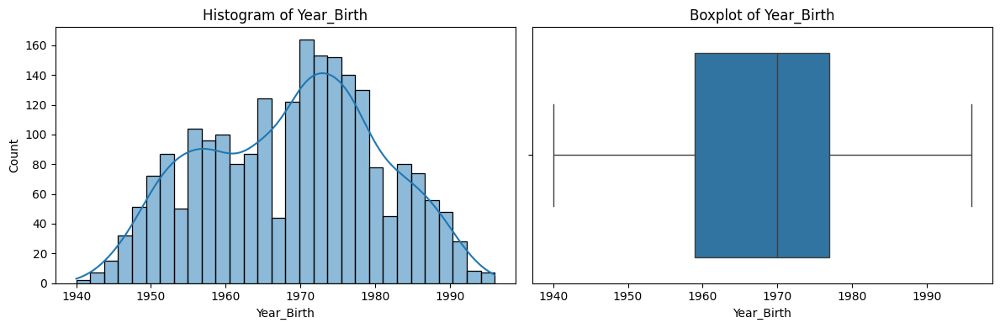

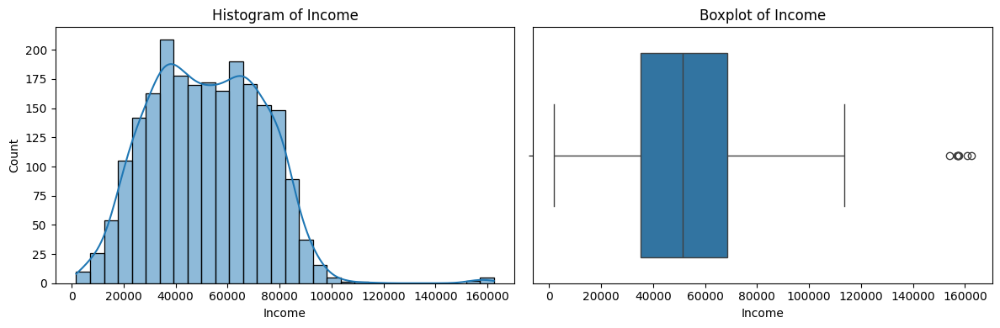

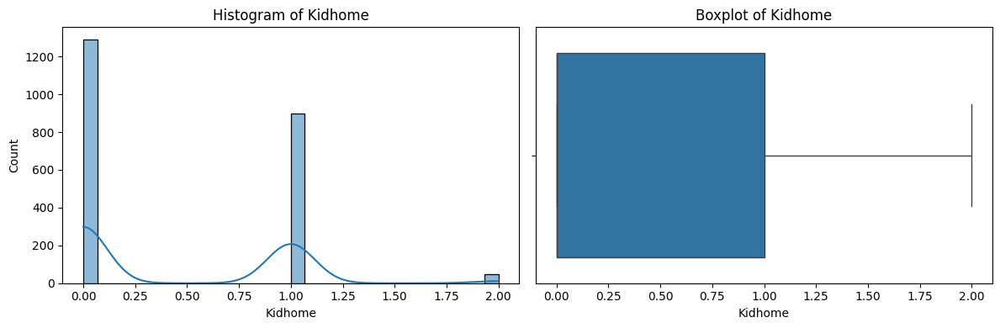

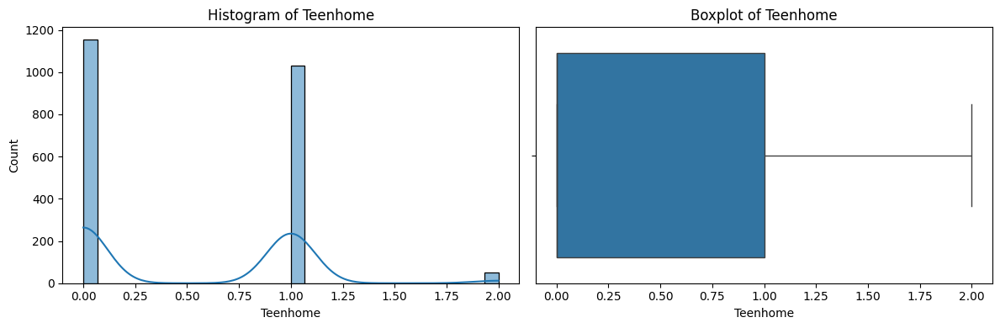

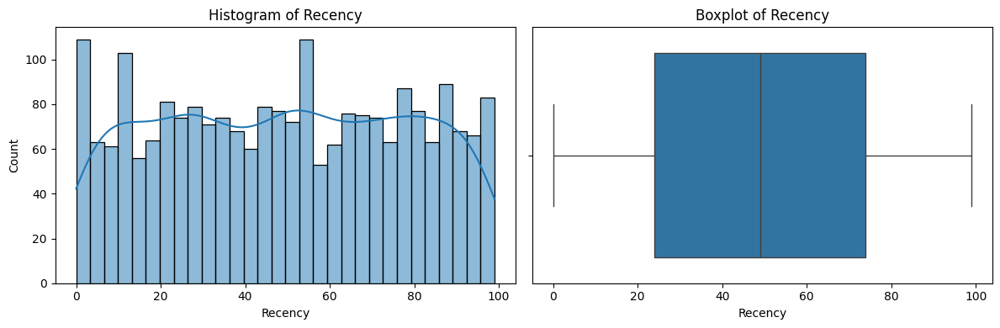

...

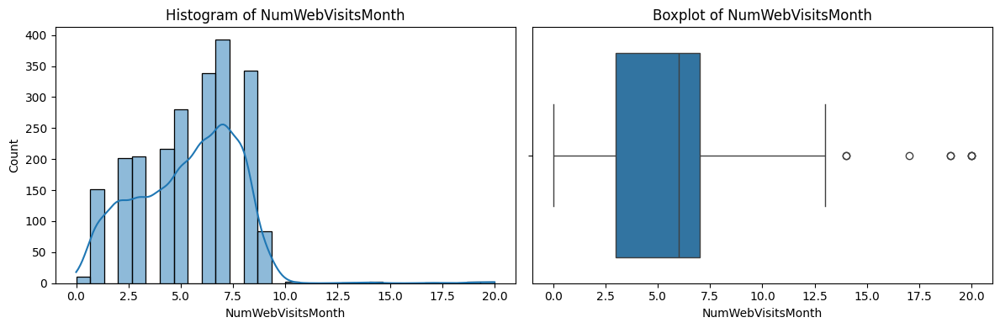

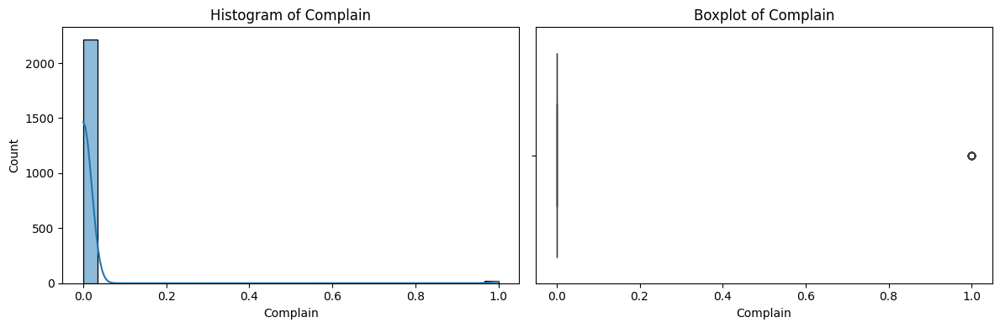

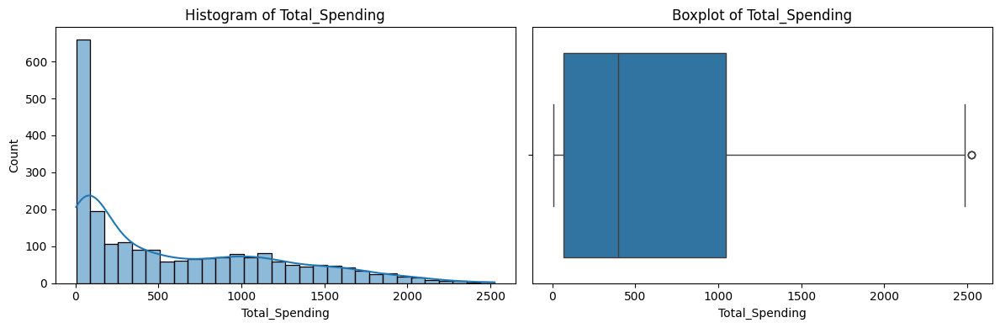

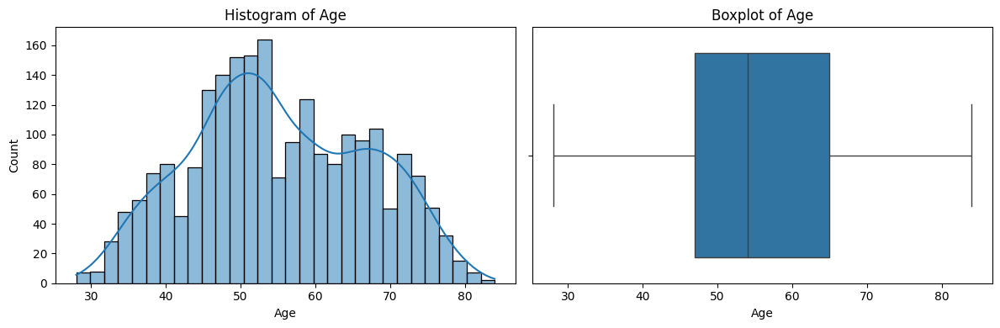

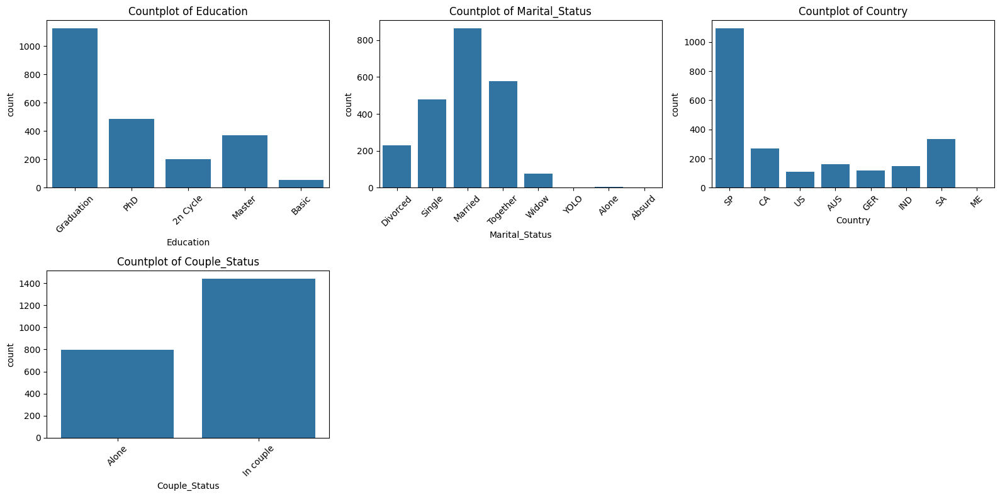

In [271]:
# Function to plot histograms and boxplots for numerical columns
def plot_numerical(df, numerical_cols):
    for col in numerical_cols:
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))  # 1 row, 2 columns: histogram and boxplot
        sns.histplot(df[col], kde=True, bins=30, ax=axes[0])
        axes[0].set_title(f'Histogram of {col}')
        sns.boxplot(data=df, x=col, ax=axes[1])
        axes[1].set_title(f'Boxplot of {col}')
        plt.tight_layout()
        plt.show()

# Function to plot count plots for categorical columns
def plot_categorical(df, categorical_cols):
    n_cols = 3  # Set number of columns per row
    n_rows = int(np.ceil(len(categorical_cols) / n_cols))  # Dynamic number of rows based on columns
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 4))  # Adjust height dynamically
    axes = axes.flatten()  # Flatten axes to iterate easily

    for idx, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[idx])
        axes[idx].set_title(f'Countplot of {col}')
        axes[idx].tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability

    # Hide any empty subplots (in case columns are not perfectly divisible by n_cols)
    for ax in axes[len(categorical_cols):]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()

# List of numerical and categorical columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

# Perform univariate analysis
plot_numerical(df, numerical_cols)
plot_categorical(df, categorical_cols)


## Step-11: Data Transformation (for skewed data)

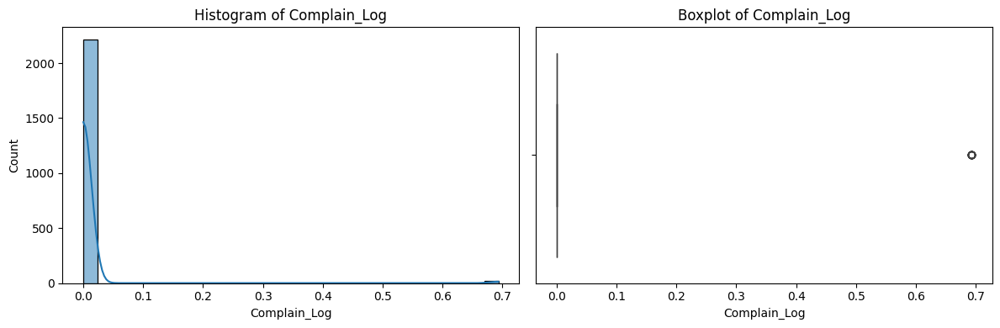

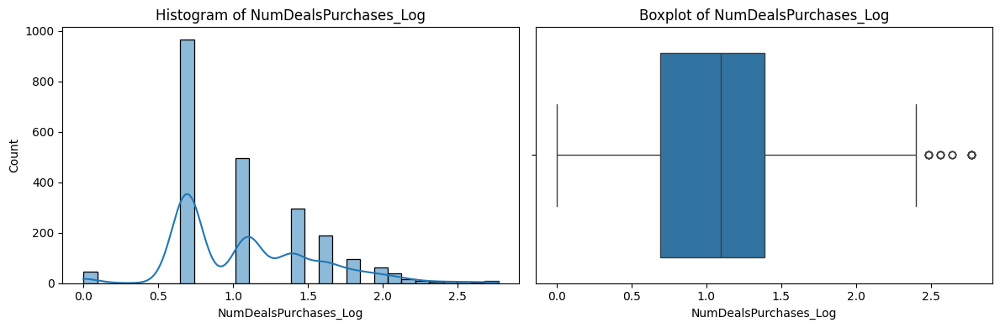

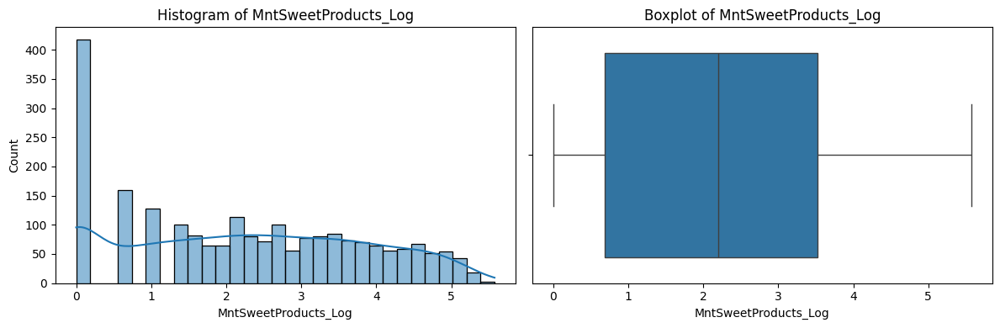

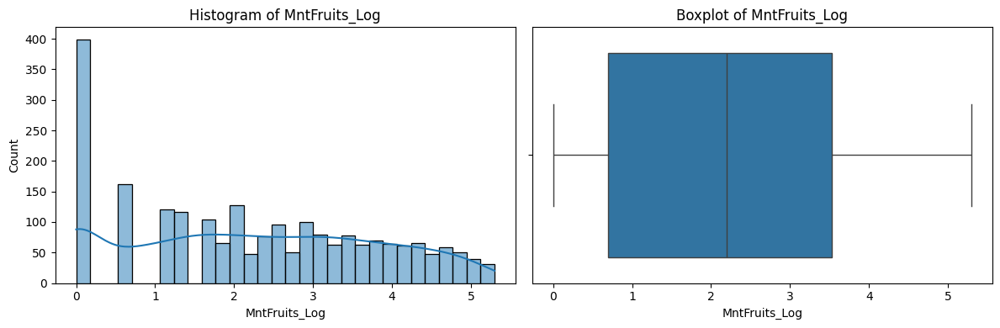

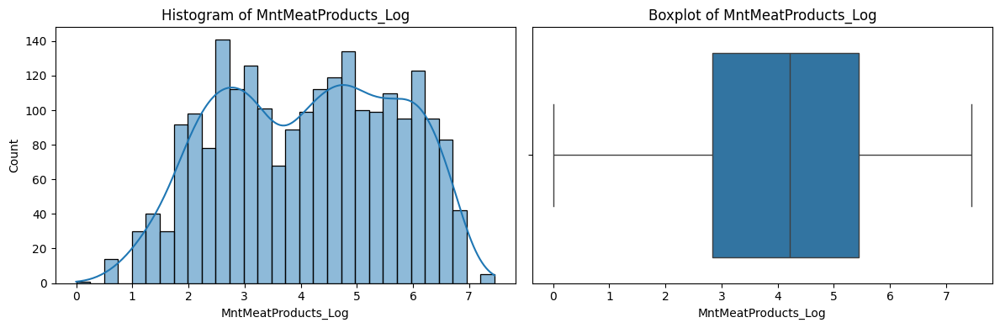

...

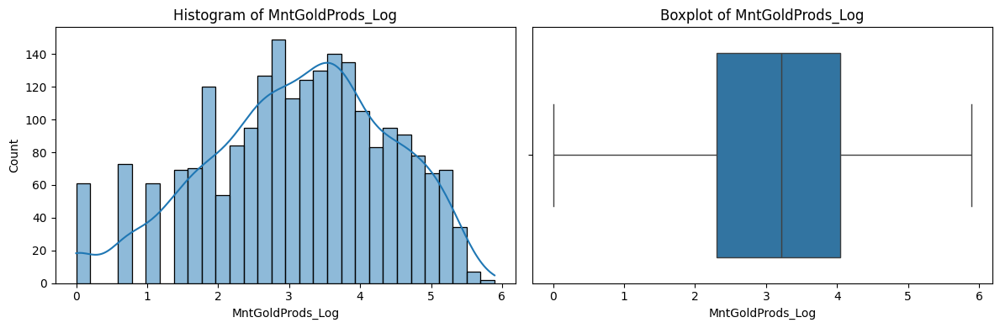

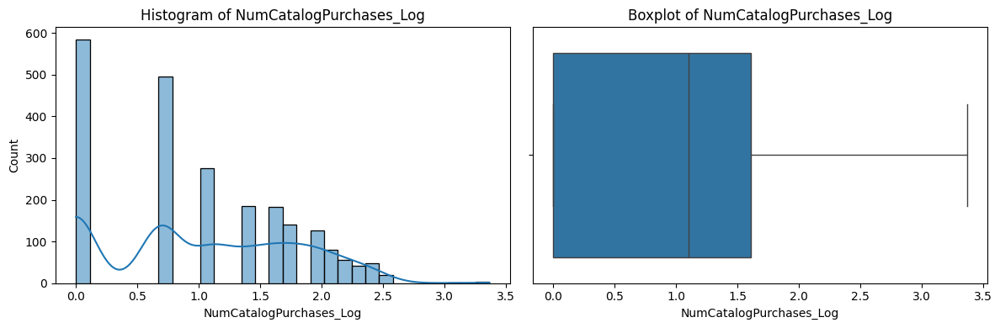

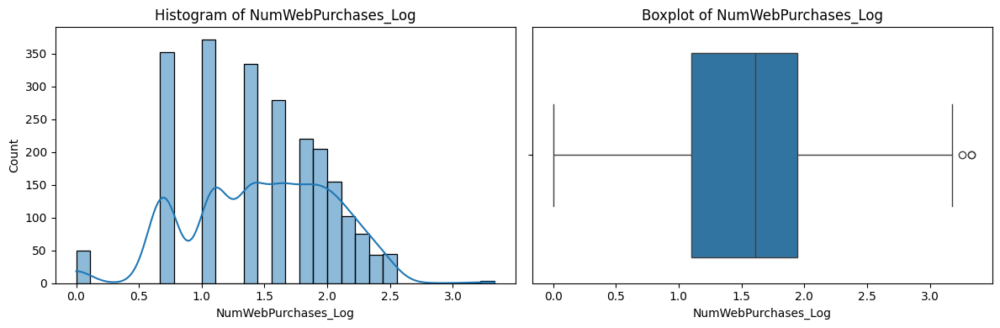

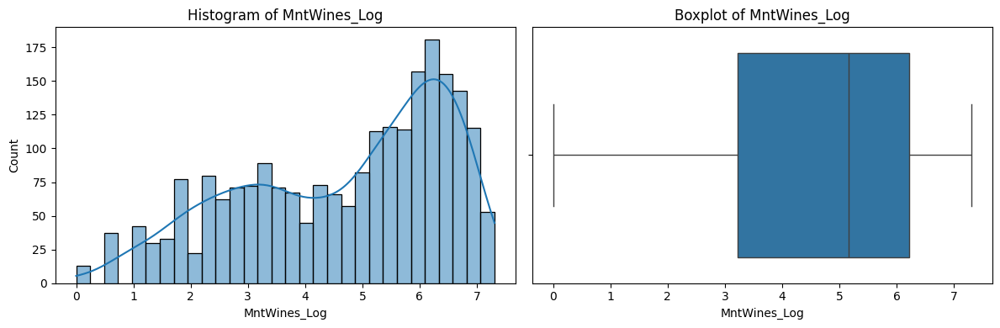

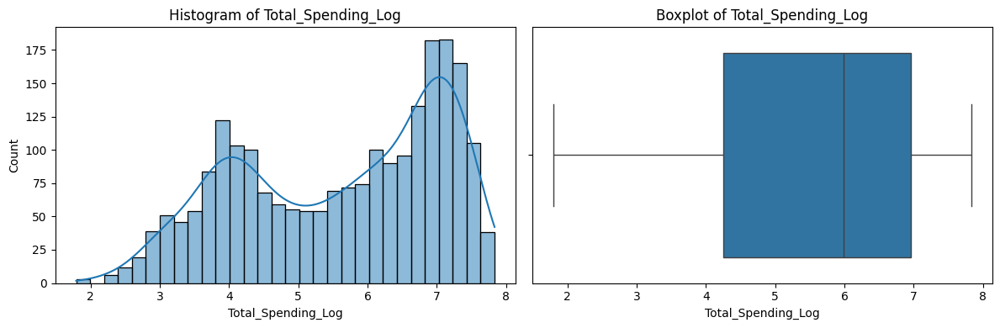

In [272]:
from scipy.stats import skew

# Identify skewed columns and apply log transformation
skewed_cols = df[numerical_cols].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
high_skew = skewed_cols[abs(skewed_cols) > 0.75]  # Threshold of 0.75 for high skewness

# Apply log transformation for highly skewed columns
for col in high_skew.index:
    df[col + '_Log'] = np.log1p(df[col])  # log1p to handle zeros in data

# Plot the transformed columns
plot_numerical(df, [col + '_Log' for col in high_skew.index])

In [273]:
df.isna().sum()

,0
Year_Birth,0
Education,0
Marital_Status,0
Income,24
Kidhome,0
Teenhome,0
Dt_Customer,0
Recency,0
MntWines,0
MntFruits,0


In [274]:
df.dropna(inplace=True)

## Step-12: Bi-Variate Analysis

In [291]:
df.head().T

,0,1,2,3,4
Year_Birth,1970,1961,1958,1967,1989
Education,Graduation,Graduation,Graduation,Graduation,Graduation
Marital_Status,Divorced,Single,Married,Together,Single
Income,84835.0,57091.0,67267.0,32474.0,21474.0
Kidhome,0,0,0,1,1
Teenhome,0,0,1,1,0
Dt_Customer,2014-06-16 00:00:00,2014-06-15 00:00:00,2014-05-13 00:00:00,2014-05-11 00:00:00,2014-04-08 00:00:00
Recency,0,0,0,0,0
MntWines,189,464,134,10,6
MntFruits,104,5,11,0,16


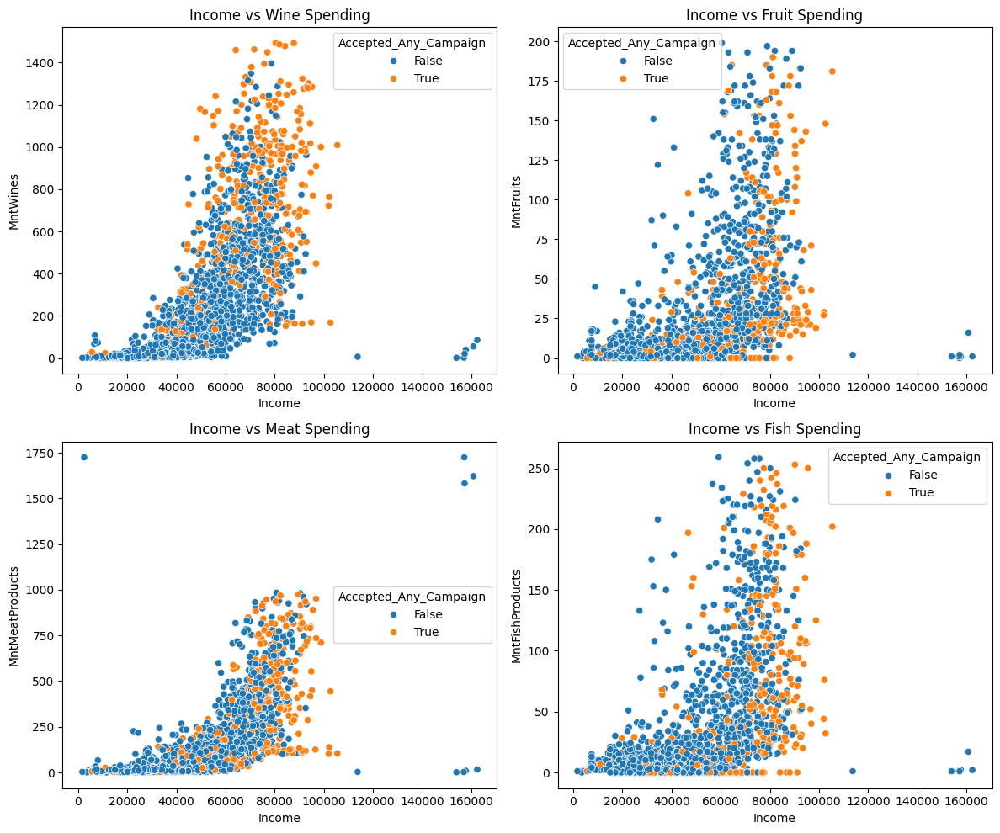

In [294]:
def scatter_plots(df, numerical_cols):
    """
    This function creates scatter plots between relevant numerical columns.
    """
    plt.figure(figsize=(12, 10))

    # Scatter: Income vs various spending categories
    plt.subplot(2, 2, 1)
    sns.scatterplot(x=df['Income'], y=df['MntWines'], hue=df['Accepted_Any_Campaign'])
    plt.title('Income vs Wine Spending')

    plt.subplot(2, 2, 2)
    sns.scatterplot(x=df['Income'], y=df['MntFruits'], hue=df['Accepted_Any_Campaign'])
    plt.title('Income vs Fruit Spending')

    plt.subplot(2, 2, 3)
    sns.scatterplot(x=df['Income'], y=df['MntMeatProducts'], hue=df['Accepted_Any_Campaign'])
    plt.title('Income vs Meat Spending')

    plt.subplot(2, 2, 4)
    sns.scatterplot(x=df['Income'], y=df['MntFishProducts'], hue=df['Accepted_Any_Campaign'])
    plt.title('Income vs Fish Spending')

    plt.tight_layout()
    plt.show()

scatter_plots(df, numerical_cols)

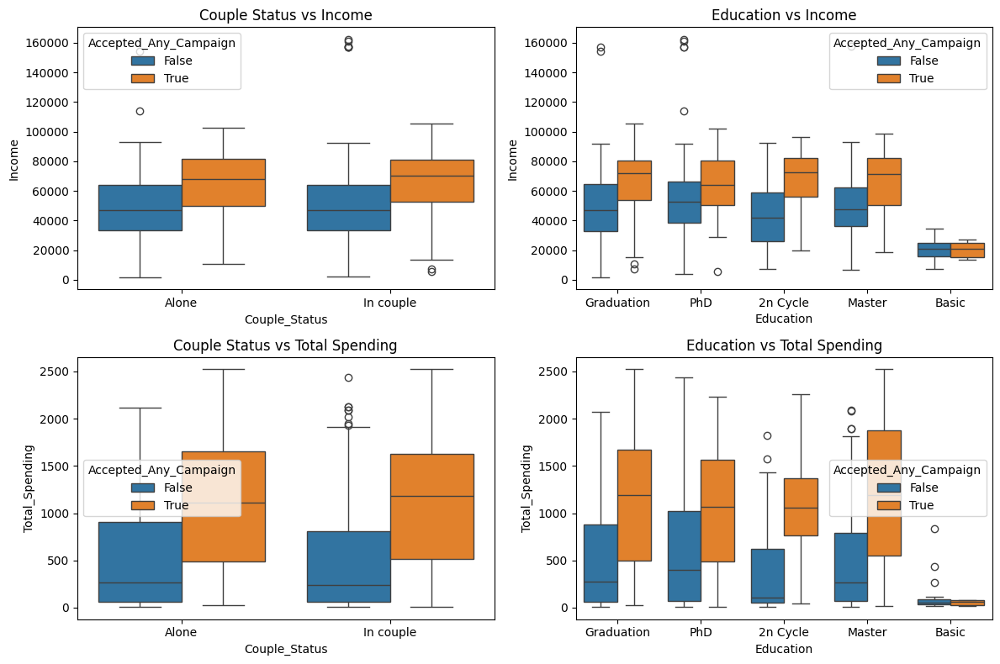

In [296]:
def box_plots(df, categorical_cols, numerical_cols):
    """
    This function creates box plots between categorical and numerical columns.
    """
    plt.figure(figsize=(12, 8))

    # Boxplot: Categorical vs Income and Spending
    plt.subplot(2, 2, 1)
    sns.boxplot(x='Couple_Status', y='Income', data=df, hue=df['Accepted_Any_Campaign'])
    plt.title('Couple Status vs Income')

    plt.subplot(2, 2, 2)
    sns.boxplot(x='Education', y='Income', data=df, hue=df['Accepted_Any_Campaign'])
    plt.title('Education vs Income')

    plt.subplot(2, 2, 3)
    sns.boxplot(x='Couple_Status', y='Total_Spending', data=df, hue=df['Accepted_Any_Campaign'])
    plt.title('Couple Status vs Total Spending')

    plt.subplot(2, 2, 4)
    sns.boxplot(x='Education', y='Total_Spending', data=df, hue=df['Accepted_Any_Campaign'])
    plt.title('Education vs Total Spending')

    plt.tight_layout()
    plt.show()

box_plots(df, categorical_cols, numerical_cols)

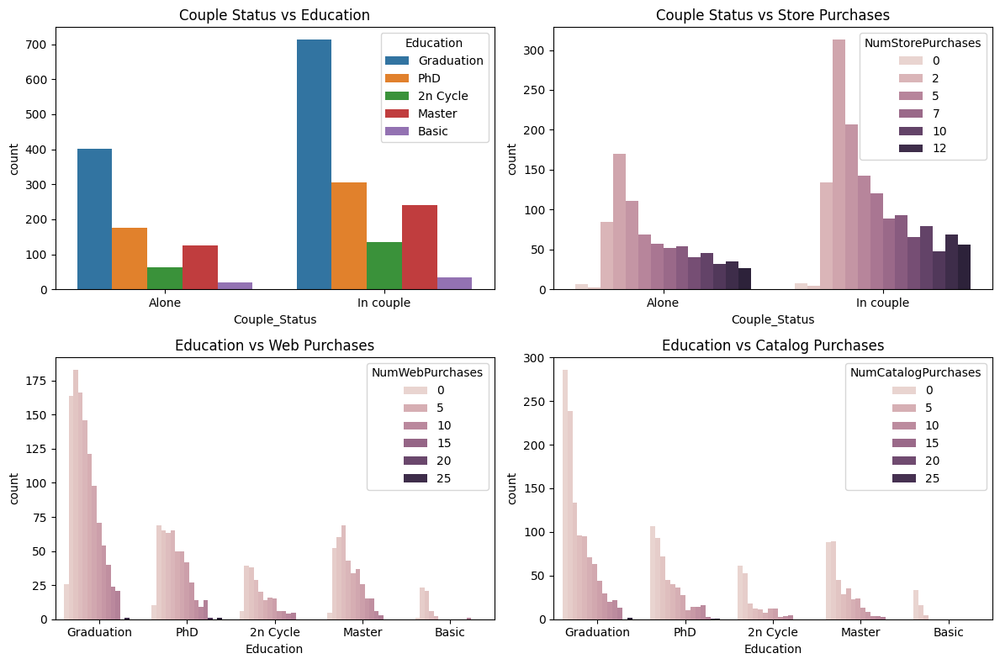

In [298]:
def bar_plots(df, categorical_cols):
    """
    This function creates bar plots between categorical columns.
    """
    plt.figure(figsize=(12, 8))

    # Barplot: Categorical vs Categorical
    plt.subplot(2, 2, 1)
    sns.countplot(x='Couple_Status', hue='Education', data=df)
    plt.title('Couple Status vs Education')

    plt.subplot(2, 2, 2)
    sns.countplot(x='Couple_Status', hue='NumStorePurchases', data=df)
    plt.title('Couple Status vs Store Purchases')

    plt.subplot(2, 2, 3)
    sns.countplot(x='Education', hue='NumWebPurchases', data=df)
    plt.title('Education vs Web Purchases')

    plt.subplot(2, 2, 4)
    sns.countplot(x='Education', hue='NumCatalogPurchases', data=df)
    plt.title('Education vs Catalog Purchases')

    plt.tight_layout()
    plt.show()

bar_plots(df, categorical_cols)

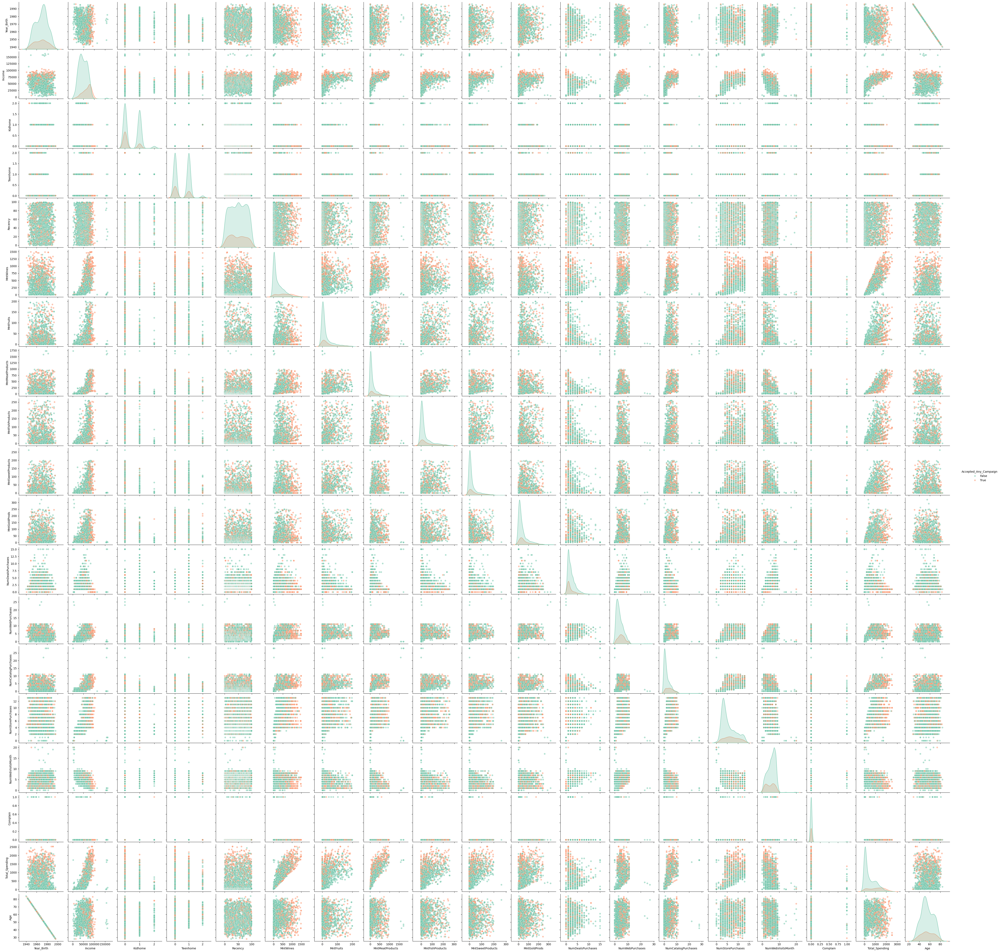

In [278]:
def pairplot_with_hue(df, numerical_cols, target_col):
    """
    This function creates pairplots for all numerical combinations with hue based on the target column.
    """
    # Select relevant numerical columns along with the target column for the pairplot
    plot_data = df[numerical_cols + [target_col]]

    # Create pairplot
    sns.pairplot(plot_data, hue=target_col, diag_kind='kde', palette='Set2', plot_kws={'alpha': 0.5})

    # Display the plot
    plt.show()

pairplot_with_hue(df, numerical_cols, 'Accepted_Any_Campaign')

## Step-13 Multi-Variate Analysis

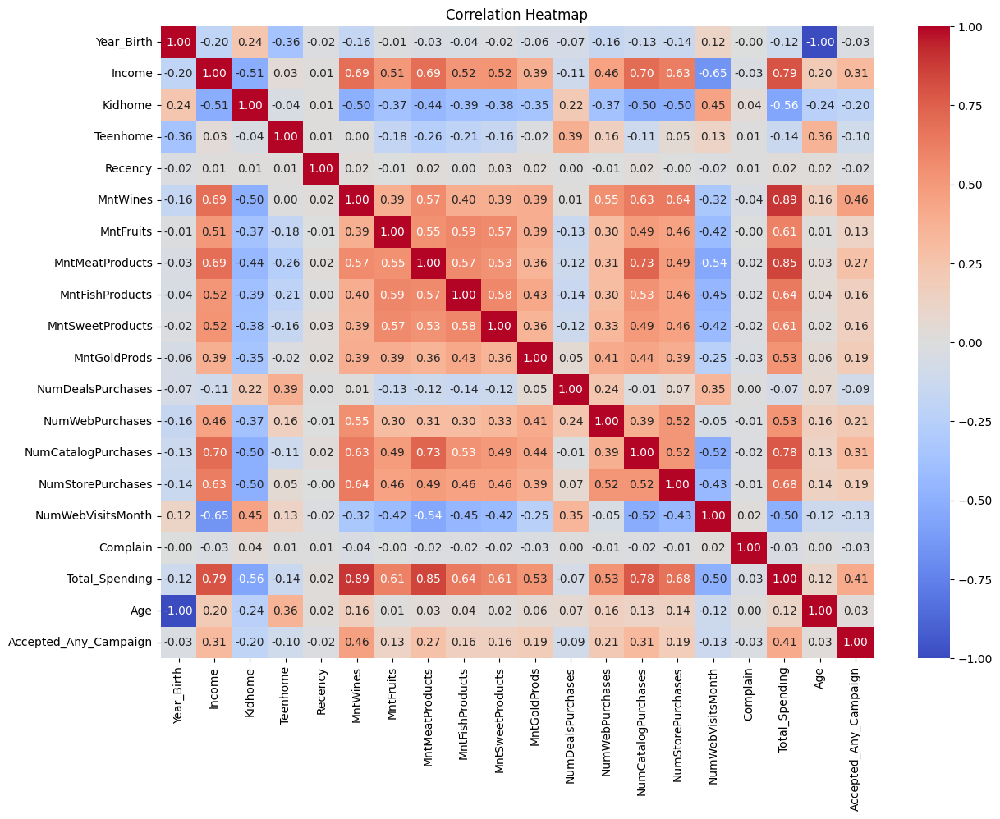

In [279]:
# Filter numerical columns and target variable for correlation analysis
corr_matrix = df[numerical_cols + target_cols].corr()

# Plot heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()


## Step-14 Performing Hypothesis Testing

Hypothesis Questions:
1. Does education level affect the income of customers?

  * Test: ANOVA (if education is categorical and income is continuous)
2. Do higher-income individuals spend more overall compared to lower-income individuals?
  * Test: T-test (comparing two income groups)
3. Do married couples spend more on wine than singles?
  * Test: T-test (comparing spending between two groups: married and singles)
4. Is there a significant difference in campaign acceptance between lower and higher-income brackets?
  * Test: Chi-square test (for categorical data: acceptance of campaigns)
5. Is there a relationship between the number of campaigns accepted and customer income?
  * Test: Spearman correlation (for ordinal data)
6. Do customers who accept campaigns have different spending habits compared to those who don’t?
  * Test: T-test (comparing spending between two groups: accepted campaigns vs. not accepted)


In [299]:
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import shapiro, ttest_ind, mannwhitneyu, f_oneway, chi2_contingency, levene, fisher_exact

def hypothesis_test(null_hypothesis, alt_hypothesis, data1, data2=None, test_type='t-test'):
    alpha = 0.05  # Significance level
    print(f"\nNull Hypothesis: {null_hypothesis}")
    print(f"Alternative Hypothesis: {alt_hypothesis}")

    # Check if comparing two datasets
    if data2 is not None:
        assert len(data1) > 0 and len(data2) > 0, "Both data samples should have values."

    # Step 2: Assumptions Check
    if test_type in ['t-test', 'anova']:
        # Check normality for parametric tests
        p_value_norm1 = shapiro(data1)[1]
        print(f"P-value for normality (group 1): {p_value_norm1}")
        if data2 is not None:
            p_value_norm2 = shapiro(data2)[1]
            print(f"P-value for normality (group 2): {p_value_norm2}")
        else:
            p_value_norm2 = None

        # If normality is violated, switch to non-parametric tests
        if p_value_norm1 < alpha or (p_value_norm2 is not None and p_value_norm2 < alpha):
            print("Normality assumption violated. Switching to non-parametric test.")
            if test_type == 't-test':
                test_type = 'mann-whitney'
            elif test_type == 'anova':
                test_type = 'kruskal'

    # Variance check for t-tests
    if test_type == 't-test' and data2 is not None:
        _, p_value_var = levene(data1, data2)
        print(f"P-value for variance equality: {p_value_var}")
        if p_value_var < alpha:
            print("Variance assumption violated. Using Mann-Whitney U test.")
            test_type = 'mann-whitney'

    # Step 3: Perform the test
    if test_type == 't-test':
        # Independent t-test (parametric)
        t_stat, p_value = ttest_ind(data1, data2, equal_var=True)
        print(f"T-statistic: {t_stat}")
    elif test_type == 'mann-whitney':
        # Mann-Whitney U test (non-parametric)
        u_stat, p_value = mannwhitneyu(data1, data2)
        print(f"U-statistic: {u_stat}")
    elif test_type == 'anova':
        # ANOVA (parametric)
        f_stat, p_value = f_oneway(data1, data2)
        print(f"F-statistic: {f_stat}")
    elif test_type == 'kruskal':
        # Kruskal-Wallis (non-parametric ANOVA)
        h_stat, p_value = stats.kruskal(data1, data2)
        print(f"H-statistic: {h_stat}")
    elif test_type == 'chi-squared':
        # Chi-Square test for categorical data
        contingency_table = pd.crosstab(data1, data2)
        chi2_stat, p_value, _, _ = chi2_contingency(contingency_table)
        print(f"Chi-Squared statistic: {chi2_stat}")
    elif test_type == 'fisher':
        # Fisher Exact test for small sample categorical data
        contingency_table = pd.crosstab(data1, data2)
        odds_ratio, p_value = fisher_exact(contingency_table)
        print(f"Odds Ratio: {odds_ratio}")

    # Step 4: Decision-making
    print(f"P-value: {p_value}")
    if p_value < alpha:
        print("Reject the null hypothesis.")
    else:
        print("Fail to reject the null hypothesis.")

In [300]:
def test_hypothesis_1(df):
    # 1. Null: Education level does not affect income
    #    Alternative: Education level affects income
    data1 = df[df['Education'] == 'Graduation']['Income']
    data2 = df[df['Education'] == 'Basic']['Income']
    hypothesis_test("Education level does not affect income",
                    "Education level affects income",
                    data1, data2, test_type='anova')

test_hypothesis_1(df)


Null Hypothesis: Education level does not affect income
Alternative Hypothesis: Education level affects income
P-value for normality (group 1): 2.609765154403154e-12
P-value for normality (group 2): 0.20598086530848786
Normality assumption violated. Switching to non-parametric test.
H-statistic: 113.02774256856688
P-value: 2.12776768762587e-26
Reject the null hypothesis.


In [301]:
def test_hypothesis_2(df):
    # 1. Null: Higher-income individuals do not spend more
    #    Alternative: Higher-income individuals spend more
    high_income = df[df['Income'] > df['Income'].median()]['Total_Spending']
    low_income = df[df['Income'] <= df['Income'].median()]['Total_Spending']
    hypothesis_test("Higher-income individuals do not spend more",
                    "Higher-income individuals spend more",
                    high_income, low_income)

test_hypothesis_2(df)


Null Hypothesis: Higher-income individuals do not spend more
Alternative Hypothesis: Higher-income individuals spend more
P-value for normality (group 1): 4.970948716448737e-07
P-value for normality (group 2): 5.190214211682396e-41
Normality assumption violated. Switching to non-parametric test.
U-statistic: 1165242.0
P-value: 1.987227450784498e-297
Reject the null hypothesis.


In [302]:
def test_hypothesis_3(df):
    # 1. Null: Married couples do not spend more on wine than singles
    #    Alternative: Married couples spend more on wine than singles
    married_spending = df[df['Marital_Status'] == 'Married']['MntWines']
    single_spending = df[df['Marital_Status'] == 'Single']['MntWines']
    hypothesis_test("Married couples do not spend more on wine than singles",
                    "Married couples spend more on wine than singles",
                    married_spending, single_spending)

test_hypothesis_3(df)


Null Hypothesis: Married couples do not spend more on wine than singles
Alternative Hypothesis: Married couples spend more on wine than singles
P-value for normality (group 1): 3.333615231124149e-29
P-value for normality (group 2): 2.0304534768700042e-22
Normality assumption violated. Switching to non-parametric test.
U-statistic: 205059.5
P-value: 0.5831388644016677
Fail to reject the null hypothesis.


In [303]:
def test_hypothesis_4(df):
    # 1. Null: No significant difference in campaign acceptance between income brackets
    #    Alternative: Significant difference in campaign acceptance between income brackets
    df['IncomeBracket'] = np.where(df['Income'] > df['Income'].median(), 'High', 'Low')
    campaign_accepted = df['Accepted_Any_Campaign']
    hypothesis_test("No significant difference in campaign acceptance between income brackets",
                    "Significant difference in campaign acceptance between income brackets",
                    campaign_accepted, df['IncomeBracket'], test_type='chi-squared')

test_hypothesis_4(df)



Null Hypothesis: No significant difference in campaign acceptance between income brackets
Alternative Hypothesis: Significant difference in campaign acceptance between income brackets
Chi-Squared statistic: 141.88672678294904
P-value: 1.0295542113515174e-32
Reject the null hypothesis.


In [304]:
def test_hypothesis_5(df):
    # 1. Null: There is no relationship between campaigns accepted and income
    #    Alternative: There is a relationship between campaigns accepted and income
    correlation, p_value = stats.spearmanr(df['Accepted_Any_Campaign'], df['Income'])
    print("\nHypothesis 6: Relationship between campaigns accepted and income")
    print(f"Spearman correlation: {correlation}, P-value: {p_value}")
    if p_value < 0.05:
        print("Reject the null hypothesis.")
    else:
        print("Fail to reject the null hypothesis.")

test_hypothesis_5(df)



Hypothesis 6: Relationship between campaigns accepted and income
Spearman correlation: 0.32421148702489455, P-value: 2.6364730873648996e-55
Reject the null hypothesis.


In [305]:
def test_hypothesis_6(df):
    # 1. Null: Customers who accept campaigns do not have different spending habits
    #    Alternative: Customers who accept campaigns have different spending habits
    acceptors = df[df['Accepted_Any_Campaign'] == 1]['Total_Spending']
    non_acceptors = df[df['Accepted_Any_Campaign'] == 0]['Total_Spending']
    hypothesis_test("Customers who accept campaigns do not have different spending habits",
                    "Customers who accept campaigns have different spending habits",
                    acceptors, non_acceptors)

test_hypothesis_6(df)



Null Hypothesis: Customers who accept campaigns do not have different spending habits
Alternative Hypothesis: Customers who accept campaigns have different spending habits
P-value for normality (group 1): 2.2396789117442009e-10
P-value for normality (group 2): 3.441381575741494e-39
Normality assumption violated. Switching to non-parametric test.
U-statistic: 611094.0
P-value: 2.381320679302262e-66
Reject the null hypothesis.


### Insights

1. **Income and Campaign Acceptance**: People with lower incomes are more likely to accept promotional campaigns, showing they are sensitive to discounts.
  
2. **Spending by Education Level**: Customers with higher education tend to spend differently across product categories, suggesting targeted marketing could be effective.

3. **Marital Status Effects**: Couples spend differently than singles. Tailoring campaigns to target families or singles could improve results.

4. **Geographic Differences**: People in different countries respond differently to campaigns, so localized marketing strategies may boost acceptance rates.

5. **Importance of Recent Purchases**: Customers who have recently bought something are more likely to accept new campaign offers, indicating timely marketing is key.

### Recommendations

1. **Focus Campaigns on Low-Income Individuals**: Create marketing campaigns specifically for lower-income groups, as they are more likely to respond to discounts.

2. **Personalized Offers**: Use spending data to create tailored offers that match individual preferences, improving customer engagement.

3. **Raise Campaign Awareness**: Implement strategies to make more customers aware of campaigns, especially those who haven’t accepted past offers.

4. **Use Social Proof**: Share testimonials from satisfied customers in similar income brackets to encourage participation in campaigns.

5. **Optimize Communication Channels**: Determine which channels (like email, SMS, or social media) work best for campaign acceptance and focus marketing efforts there.